## Model for outcome 6 months after the (first) stroke

In [32]:
# general
import pandas as pd
import numpy as np
from functions import modeling_14d

# plot libarys
import seaborn as sns
import matplotlib.pyplot as plt

# Model preparation
#import imblearn
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, cross_validate
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler, LabelEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer, make_column_selector
 

# Classifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, export_graphviz  
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier

## Cluster and Dimension Reduction
from sklearn.cluster import DBSCAN, MiniBatchKMeans, KMeans, AgglomerativeClustering
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# Model Metrics
from sklearn.metrics import precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix, classification_report, plot_confusion_matrix
from sklearn.metrics import f1_score, make_scorer # for modelling.py

# for merging the dataframes
import os, glob
import json

# further libarys
#import itertools
from sklearn.tree import export_graphviz
from collections import Counter

%matplotlib inline

In [3]:
#df = pd.read_csv('data/IST_corrected_model.csv',  index_col= [0])

In [4]:
df = pd.read_csv('data/IST_corrected_clean.csv',  index_col= [0])

In [5]:
# Only keep patients with an ischaemic stroke => df['DDIAGISC'].eq('Y')
df = df[df['DDIAGISC'].eq('Y')]

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16225 entries, 0 to 19434
Columns: 115 entries, HOSPNUM to DEAD
dtypes: float64(16), int64(30), object(69)
memory usage: 14.4+ MB


In [7]:
df.index = pd.RangeIndex(len(df.index))

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16225 entries, 0 to 16224
Columns: 115 entries, HOSPNUM to DEAD
dtypes: float64(16), int64(30), object(69)
memory usage: 14.2+ MB


### Target for 14 days after first stroke

Target for the second model is the outcome 6 months after the (first) stroke. (OCCODE)


In [9]:
#1: dead, 2: dependent, 3: not recovered, 4: recovered
df.OCCODE.value_counts()

2    6489
1    3544
3    3371
4    2821
Name: OCCODE, dtype: int64

In [10]:
print(f'Patients recovered: {round((df.OCCODE.value_counts()[4] / df.shape[0] * 100),1)} %')
print(f'Patients not recovered: {round((df.OCCODE.value_counts()[3] / df.shape[0] * 100),1)} %')
print(f'Patients dependent: {round((df.OCCODE.value_counts()[2] / df.shape[0] * 100),1)} %')
print(f'Patients deceased: {round((df.OCCODE.value_counts()[1] / df.shape[0] * 100),1)} %')

Patients recovered: 17.4 %
Patients not recovered: 20.8 %
Patients dependent: 40.0 %
Patients deceased: 21.8 %


In [11]:
# Select features
features = ['SEX', 'AGE', 'RSBP', 'STYPE', 'RDEF1', 'RDEF2', 'RDEF3', 'RDEF4', 'RDEF5', 'RDEF6', 'RDEF7', 'RDEF8', 'ONDRUG',
                'DASP14', 'DLH14', 'DMH14', 'RDELAY']
X = df[features]

# Select target
y = df.OCCODE

In [12]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16225 entries, 0 to 16224
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SEX     16225 non-null  object 
 1   AGE     16225 non-null  int64  
 2   RSBP    16225 non-null  int64  
 3   STYPE   16225 non-null  object 
 4   RDEF1   16225 non-null  object 
 5   RDEF2   16225 non-null  object 
 6   RDEF3   16225 non-null  object 
 7   RDEF4   16225 non-null  object 
 8   RDEF5   16225 non-null  object 
 9   RDEF6   16225 non-null  object 
 10  RDEF7   16225 non-null  object 
 11  RDEF8   16225 non-null  object 
 12  ONDRUG  16225 non-null  float64
 13  DASP14  16225 non-null  object 
 14  DLH14   16225 non-null  object 
 15  DMH14   16225 non-null  object 
 16  RDELAY  16225 non-null  int64  
dtypes: float64(1), int64(3), object(13)
memory usage: 2.1+ MB


In [13]:
print(sorted(Counter(y).items()))

[(1, 3544), (2, 6489), (3, 3371), (4, 2821)]


In [14]:
# Split the data in test and training set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [15]:
#convert all 'objects' into 'categories'
X_train = pd.concat([
        X_train.select_dtypes([], ['object']),
        X_train.select_dtypes(['object']).apply(pd.Series.astype, dtype='category')
        ], axis=1).reindex(X_train.columns, axis=1)
X_train.index = pd.RangeIndex(len(X_train.index))

In [16]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11357 entries, 0 to 11356
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   SEX     11357 non-null  category
 1   AGE     11357 non-null  int64   
 2   RSBP    11357 non-null  int64   
 3   STYPE   11357 non-null  category
 4   RDEF1   11357 non-null  category
 5   RDEF2   11357 non-null  category
 6   RDEF3   11357 non-null  category
 7   RDEF4   11357 non-null  category
 8   RDEF5   11357 non-null  category
 9   RDEF6   11357 non-null  category
 10  RDEF7   11357 non-null  category
 11  RDEF8   11357 non-null  category
 12  ONDRUG  11357 non-null  float64 
 13  DASP14  11357 non-null  category
 14  DLH14   11357 non-null  category
 15  DMH14   11357 non-null  category
 16  RDELAY  11357 non-null  int64   
dtypes: category(13), float64(1), int64(3)
memory usage: 500.9 KB


In [17]:
#convert all 'objects' into 'categories'
X_test = pd.concat([
        X_test.select_dtypes([], ['object']),
        X_test.select_dtypes(['object']).apply(pd.Series.astype, dtype='category')
        ], axis=1).reindex(X_test.columns, axis=1)
X_test.index = pd.RangeIndex(len(X_test.index))

In [28]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4868 entries, 5631 to 13035
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   SEX     4868 non-null   category
 1   AGE     4868 non-null   int64   
 2   RSBP    4868 non-null   int64   
 3   STYPE   4868 non-null   category
 4   RDEF1   4868 non-null   category
 5   RDEF2   4868 non-null   category
 6   RDEF3   4868 non-null   category
 7   RDEF4   4868 non-null   category
 8   RDEF5   4868 non-null   category
 9   RDEF6   4868 non-null   category
 10  RDEF7   4868 non-null   category
 11  RDEF8   4868 non-null   category
 12  ONDRUG  4868 non-null   float64 
 13  DASP14  4868 non-null   category
 14  DLH14   4868 non-null   category
 15  DMH14   4868 non-null   category
 16  RDELAY  4868 non-null   int64   
dtypes: category(13), float64(1), int64(3)
memory usage: 253.7 KB


In [18]:
y_train.index = pd.RangeIndex(len(y_train.index))
y_test.index = pd.RangeIndex(len(y_test.index))

In [61]:
#### Helper functions

### Preparation of Data Scaling and Category Encoding
Some models need scaling of numerical features and encoding of categorical features. The sklearn preprocessors are instantiated here and used where necessary in the data transformation step of each model.

In [19]:
# encoder for categories
onehot = OneHotEncoder(drop="first")

# scalers for numerical features
mms = MinMaxScaler()
ss = StandardScaler()

# Prepare list of numerical and categorical columns
num_cols = make_column_selector(dtype_include=np.number)
cat_cols = make_column_selector(dtype_include='category')

In [20]:
# Define transformer
transformer = ColumnTransformer([
    ("encode", onehot, cat_cols),
    ("scale", ss, num_cols)
])

# Transform
X_train_trans = transformer.fit_transform(X_train)
X_test_trans = transformer.transform(X_test)

In [21]:
pca_ = PCA(0.99, random_state=0)
X_train_pca = pca_.fit_transform(X_train_trans)

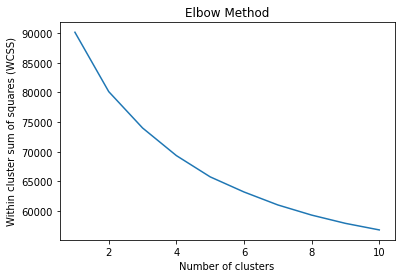

In [44]:
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=150, n_init=10, random_state=42)
    kmeans.fit(X_train_pca)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Within cluster sum of squares (WCSS)')
plt.show()

In [36]:
# Creating the KMeans Clustering model and fit it to our data X_pca after Dimensionality Reduction
kmeans = KMeans(n_clusters=4, verbose=0, init='k-means++', max_iter=150, n_init=20, random_state=0)
kmeans.fit(X_train_pca)


KMeans(max_iter=150, n_clusters=4, n_init=20, random_state=0)

In [37]:
# Using t-SNE to prepare the data for plotting
model1 = TSNE(n_components=2, random_state=0)

Y = model1.fit_transform(X_train_pca)

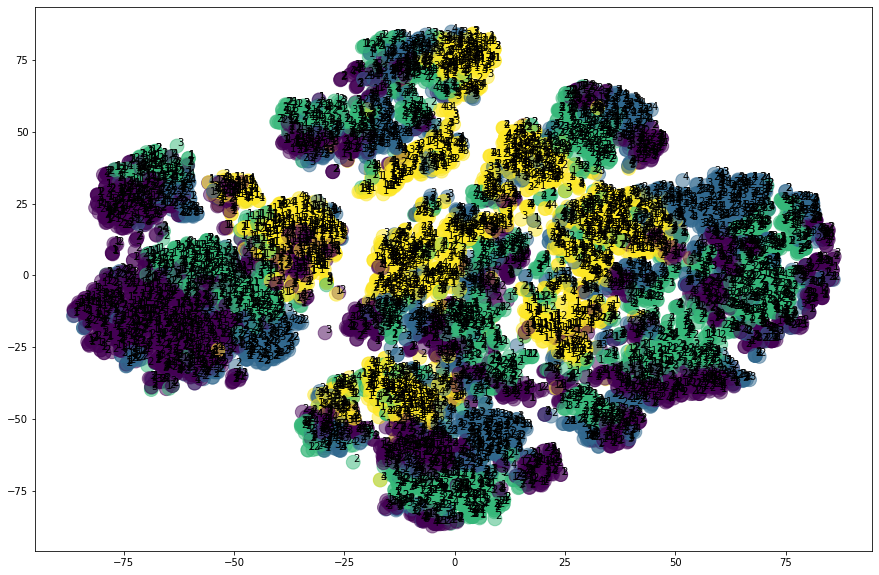

In [38]:
plt.rcParams['figure.figsize'] = (15, 10)

plt.scatter(Y[:, 0], Y[:, 1],c=kmeans.labels_,  s=190,alpha=.5); 
for j in range(len(y_train)):    
    plt.annotate(y_train[j], xy=(Y[j][0], Y[j][1]), xytext=(0,0), textcoords='offset points')

In [39]:
# Create new dataframe with real and predicted labels 
df_result = pd.DataFrame()
df_result['org_target'] = y_train
df_result['pred_target'] = kmeans.labels_
df_result.head()

,org_target,pred_target
0,3,1
1,4,3
2,4,1
3,3,1
4,2,2


In [40]:
print(df_result.org_target.unique())
print(df_result.pred_target.unique())

[3 4 2 1]
[1 3 2 0]


In [41]:
# Since we know the correct lables we can also evaluate the performance of the algorithm
print(confusion_matrix(y_train,kmeans.labels_))
print(classification_report(y_train,kmeans.labels_))

[[   0    0    0    0    0]
 [1019  149  602  742    0]
 [1714  772 1485  549    0]
 [ 473  709  599  584    0]
 [ 364  458  354  784    0]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.07      0.06      0.06      2512
           2       0.49      0.33      0.39      4520
           3       0.22      0.25      0.23      2365
           4       0.00      0.00      0.00      1960

    accuracy                           0.20     11357
   macro avg       0.16      0.13      0.14     11357
weighted avg       0.26      0.20      0.22     11357

/Users/Nicole/Documents/Data_Science/neuefische/projects/Capstone/stroke/Capstone/.venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_st

### MiniBatch KMeans

In [44]:
# Creating the MiniBatchKMeans Clustering model and fit it to our preprocessed data
batch_kmeans = MiniBatchKMeans(n_clusters=4, verbose=0, max_iter=150, n_init=20, random_state=0)
batch_kmeans.fit(X_train_pca)

MiniBatchKMeans(max_iter=150, n_clusters=4, n_init=20, random_state=0)

In [45]:
# Using t-SNE to prepare the data for plotting
model2 = TSNE(n_components=2, random_state=0)

Y = model2.fit_transform(X_train_pca)


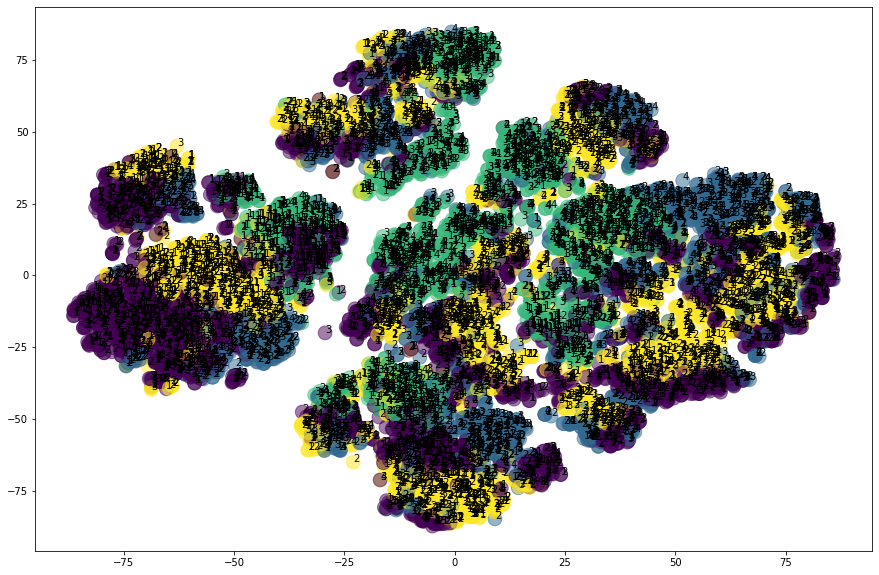

In [46]:
plt.rcParams['figure.figsize'] = (15, 10)

plt.scatter(Y[:, 0], Y[:, 1], c=batch_kmeans.labels_,  s=190, alpha=.5);
for j in range(len(y_train)):    
    plt.annotate(y_train[j], xy=(Y[j][0], Y[j][1]), xytext=(0,0), textcoords='offset points') 

In [47]:
# Since we know the correct lables we can also evaluate the performance of the algorithm
print(confusion_matrix(y_train,kmeans.labels_))
print(classification_report(y_train,kmeans.labels_))

[[   0    0    0    0    0]
 [1019  149  602  742    0]
 [1714  772 1485  549    0]
 [ 473  709  599  584    0]
 [ 364  458  354  784    0]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.07      0.06      0.06      2512
           2       0.49      0.33      0.39      4520
           3       0.22      0.25      0.23      2365
           4       0.00      0.00      0.00      1960

    accuracy                           0.20     11357
   macro avg       0.16      0.13      0.14     11357
weighted avg       0.26      0.20      0.22     11357

/Users/Nicole/Documents/Data_Science/neuefische/projects/Capstone/stroke/Capstone/.venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_st